### Μηχανική Μάθηση
#### 2η ατομική εργασία
ΣΗΜΜΥ- ΕΜΠ - 7ο εξάμηνο -Ακ. Έτος 2023-24



### Εισαγωγή
Στην άσκηση αυτή θα χρησιμοποιήσετε τη μέθοδο συσταδοποίησης k-Μeans, καθώς και τη μέθοδο μείωσης διαστατικότητας PCA σε υπερφασματική εικόνα.

Ονοματεπώνυμο φοιτητή: ΚΑΡΑΜ ΚΩΝΣΤΑΝΤΙΝΟΣ


### 1. Φόρτωση υπερφασματικής εικόνας

Κατεβάστε την υπερφασματική εικόνα `indian_pines_corrected.npy` και τις αντίστοιχες επισημειώσεις `indian_pines_gt.npy` από το Google Drive:
https://drive.google.com/drive/folders/15hbGoLga9n4K6wxRP6qsLV1P-7Nj-Vht?usp=sharing

1.α. Φορτώστε την εικόνα με χρήση της συνάρτησης numpy.load

In [93]:
import numpy as np
data = np.load('indian_pines_corrected.npy', allow_pickle=True)

1.β. Χρησιμοποιώντας την ίδια συνάρτηση, φορτώστε τις αντίστοιχες επισημειώσεις ανά pixel εικόνας `indian_pines_gt.npy`. Οι επισημειώσεις αυτές αντιστοιχίζουν κάθε pixel της υπερφασματικής εικόνας σε ένα τύπο από 17 διαφορετικές κατηγορίες (η επισημείωση 0 αντιστοιχεί σε "Undefined"):

```python
classes = [
    "Undefined",
    "Alfalfa",
    "Corn-notill",
    "Corn-mintill",
    "Corn",
    "Grass-pasture",
    "Grass-trees",
    "Grass-pasture-mowed",
    "Hay-windrowed",
    "Oats",
    "Soybean-notill",
    "Soybean-mintill",
    "Soybean-clean",
    "Wheat",
    "Woods",
    "Buildings-Grass-Trees-Drives",
    "Stone-Steel-Towers"
]
```

In [94]:
labels = np.load('indian_pines_gt.npy')

### 2. Οπτικοποίηση και Διερευνητική ανάλυση δεδομένων

Παρουσιάστε με χρήση κώδικα πληροφορίες για τα εξής:

2α. Βρείτε το ύψος και το πλάτος της εικόνας, καθώς και τον αριθμό των υπερφασματικών καναλιών

2β. Σχεδιάστε με χρήση της matplotlib το 3ο, 65ο, και 95ο κανάλι της εικόνας

2γ. Υπολογίστε τον αριθμό των διαφορετικών κατηγοριών καλλιέργειας/κλάσης στις επισημειώσεις

2δ. Σχεδιάστε με χρήση της matplotlib τις επισημειώσεις σε μορφή εικόνας. Προσθέστε επιπλέον επεξηγηματική λεζάντα με χρήση της βιβλιοθήκης κάθε επισημείωσης (χρησιμοποιήστε τη λίστα `classes` που σας δόθηκε προηγουμένως).

2ε. Υπολογίστε πόσα pixels της εικόνας αντιστοιχούν σε κάθε τύπο καλλιέργειας

2α. Βρείτε το ύψος και το πλάτος της εικόνας, καθώς και τον αριθμό των υπερφασματικών καναλιών

In [95]:
data.shape

(145, 145, 200)

Ύψος=145
Πλάτος=145
Αριθμός Υπερφασματικών Καναλιών= 200


2β. Σχεδιάστε με χρήση της matplotlib το 3ο, 65ο, και 95ο κανάλι της εικόνας

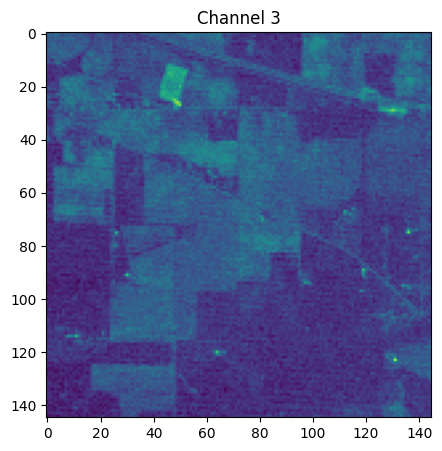

In [96]:
import matplotlib.pyplot as plt
third_channel = data[:,:,2]
plt.figure(figsize=(15,5))
plt.title(f'Channel {3}')
plt.imshow(third_channel)

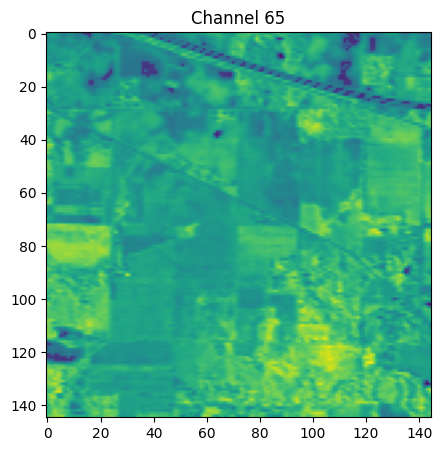

In [97]:
sixfive_channel = data[:,:,64]
plt.figure(figsize=(15,5))
plt.title(f'Channel {65}')
plt.imshow(sixfive_channel)

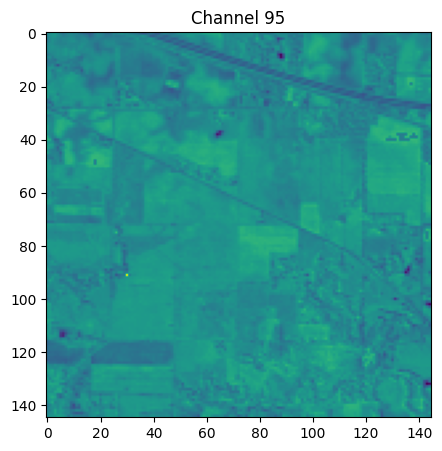

In [98]:
ninetyfive_channel = data[:,:,94]
plt.figure(figsize=(15,5))
plt.title(f'Channel {95}')
plt.imshow(ninetyfive_channel)

2γ. Υπολογίστε τον αριθμό των διαφορετικών κατηγοριών καλλιέργειας/κλάσης στις επισημειώσεις

In [99]:
labels.shape

(145, 145)

In [100]:
unique_classes,count = np.unique(labels,return_counts=True)

# Compute the number of different categories
num_categories = len(unique_classes)
print(num_categories)


17


2δ. Σχεδιάστε με χρήση της matplotlib τις επισημειώσεις σε μορφή εικόνας. Προσθέστε επιπλέον επεξηγηματική λεζάντα με χρήση της βιβλιοθήκης κάθε επισημείωσης (χρησιμοποιήστε τη λίστα `classes` που σας δόθηκε προηγουμένως).

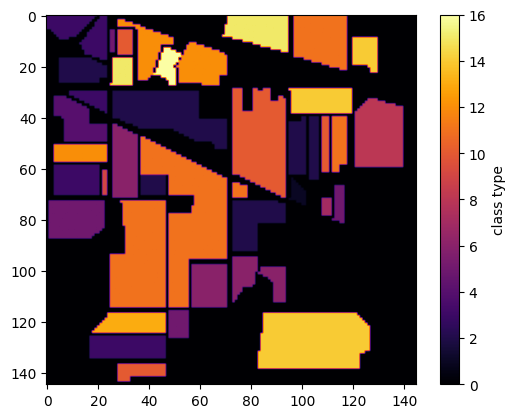

0 = Undefined
1 = Alfalfa
2 = Corn-notill
3 = Corn-mintill
4 = Corn
5 = Grass-pasture
6 = Grass-trees
7 = Grass-pasture-mowed
8 = Hay-windrowed
9 = Oats
10 = Soybean-notill
11 = Soybean-mintill
12 = Soybean-clean
13 = Wheat
14 = Woods
15 = Buildings-Grass-Trees-Drives
16 = Stone-Steel-Towers


In [101]:
classes = [
    "Undefined",
    "Alfalfa",
    "Corn-notill",
    "Corn-mintill",
    "Corn",
    "Grass-pasture",
    "Grass-trees",
    "Grass-pasture-mowed",
    "Hay-windrowed",
    "Oats",
    "Soybean-notill",
    "Soybean-mintill",
    "Soybean-clean",
    "Wheat",
    "Woods",
    "Buildings-Grass-Trees-Drives",
    "Stone-Steel-Towers"
]

import matplotlib.pyplot as plt
plt.imshow( labels , cmap = 'inferno' )
# Adding a color bar to the plot
plt.colorbar(label='class type')

# Displaying the plot
plt.show()

for i in range(0,17):
  print(i, '=', classes[i])

In [102]:
for i in range(0,17):
  print('Στην επισημείωση' , classes[i], 'αντιστοιχούν', count[i], 'pixels')


Στην επισημείωση Undefined αντιστοιχούν 10776 pixels
Στην επισημείωση Alfalfa αντιστοιχούν 46 pixels
Στην επισημείωση Corn-notill αντιστοιχούν 1428 pixels
Στην επισημείωση Corn-mintill αντιστοιχούν 830 pixels
Στην επισημείωση Corn αντιστοιχούν 237 pixels
Στην επισημείωση Grass-pasture αντιστοιχούν 483 pixels
Στην επισημείωση Grass-trees αντιστοιχούν 730 pixels
Στην επισημείωση Grass-pasture-mowed αντιστοιχούν 28 pixels
Στην επισημείωση Hay-windrowed αντιστοιχούν 478 pixels
Στην επισημείωση Oats αντιστοιχούν 20 pixels
Στην επισημείωση Soybean-notill αντιστοιχούν 972 pixels
Στην επισημείωση Soybean-mintill αντιστοιχούν 2455 pixels
Στην επισημείωση Soybean-clean αντιστοιχούν 593 pixels
Στην επισημείωση Wheat αντιστοιχούν 205 pixels
Στην επισημείωση Woods αντιστοιχούν 1265 pixels
Στην επισημείωση Buildings-Grass-Trees-Drives αντιστοιχούν 386 pixels
Στην επισημείωση Stone-Steel-Towers αντιστοιχούν 93 pixels


### 3. Εύρεση φασματικών υπογραφών

3.α. Μετατρέψτε την υπερφασματική εικόνα και τις επισημειώσεις σε μορφή κατάλληλη για περαιτέρω επεξεργασία. Η εικόνα θα πρέπει να μετατραπεί σε πίνακα N x Κ, όπου Ν είναι ο αριθμός των pixels και K ο αριθμός των καναλιών. Οι επισημειώσεις αντίστοιχα θα πρέπει να μετατραπούν σε διάνυσμα μήκους Ν. Στη συνέχεια, αφαιρέστε όσα δεδομένα είναι επισημειωμένα ως `Undefined`.

💡 Χρησιμοποιήστε την `numpy reshape`

In [103]:
# reshape data
data_reshaped = np.reshape(data, (145*145, 200))
data_reshaped.shape

(21025, 200)

In [104]:
# reshape labels
labels_flattened = labels.flatten() # to flatten metatrepei 2d-->1d

# delete undefined pixels
data_clean = np.delete(data_reshaped, np.where(labels_flattened == 0), 0)
labels_clean = np.delete(labels_flattened, np.where(labels_flattened == 0))

In [105]:
data_clean.shape

(10249, 200)

In [106]:
labels_flattened.shape

(21025,)

3.β. Επιλέξτε ένα τυχαίο pixel της εικόνας από κάθε κατηγορία, είτε με προγραμματιστικό τρόπο, είτε χειροκίνητα.

In [107]:
def rand_pixel(labels):
    counter = 0
    w = np.random.randint(0,len(labels))
    number_of_classes = len(np.unique(labels))
    random_pixel = [0] * (number_of_classes + 1)
    while(counter < number_of_classes):
      if random_pixel[labels[w]] == 0:
        random_pixel[labels[w]] = w
        counter += 1
      w = (w + np.random.randint(1, len(labels))) % len(labels)

    for i in range(1,17):
      print(i,': Pixel', random_pixel[i], 'represents class type', classes[i])

    return random_pixel

In [108]:
random_pixel=rand_pixel(labels_clean)

1 : Pixel 6080 represents class type Alfalfa
2 : Pixel 3770 represents class type Corn-notill
3 : Pixel 2004 represents class type Corn-mintill
4 : Pixel 2263 represents class type Corn
5 : Pixel 6363 represents class type Grass-pasture
6 : Pixel 8026 represents class type Grass-trees
7 : Pixel 6335 represents class type Grass-pasture-mowed
8 : Pixel 2549 represents class type Hay-windrowed
9 : Pixel 5623 represents class type Oats
10 : Pixel 5260 represents class type Soybean-notill
11 : Pixel 5202 represents class type Soybean-mintill
12 : Pixel 4766 represents class type Soybean-clean
13 : Pixel 8760 represents class type Wheat
14 : Pixel 10107 represents class type Woods
15 : Pixel 171 represents class type Buildings-Grass-Trees-Drives
16 : Pixel 1776 represents class type Stone-Steel-Towers


3.γ. Γράψτε κώδικα για να σχεδιάσετε την υπερφασματική υπογραφή των επιλεγμένων pixels.

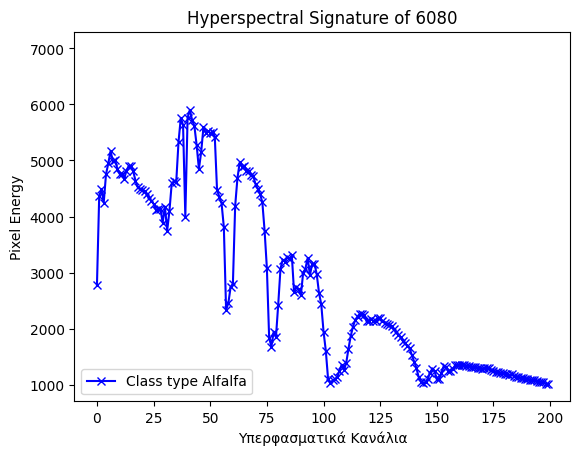

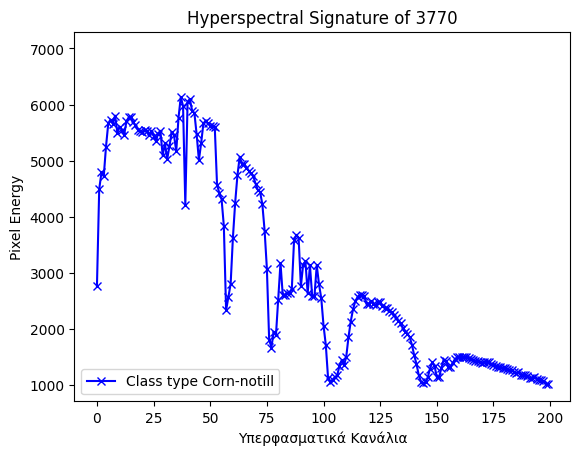

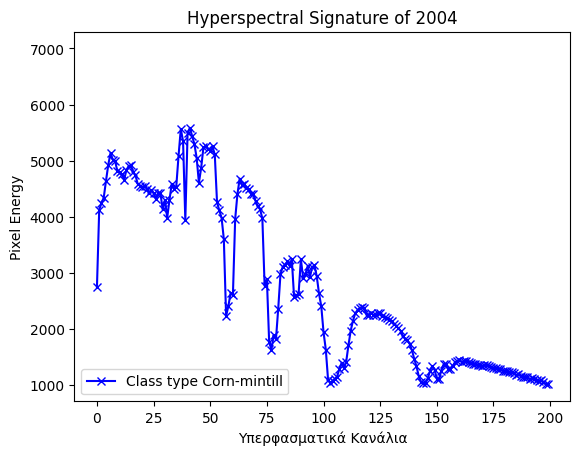

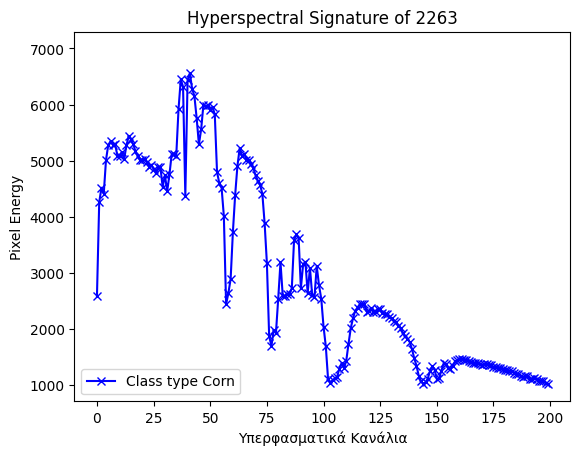

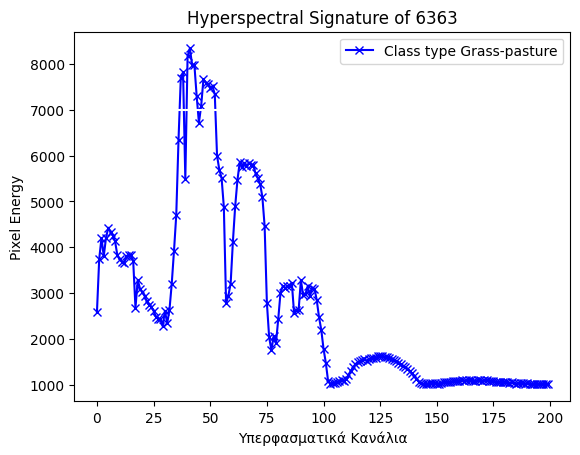

...

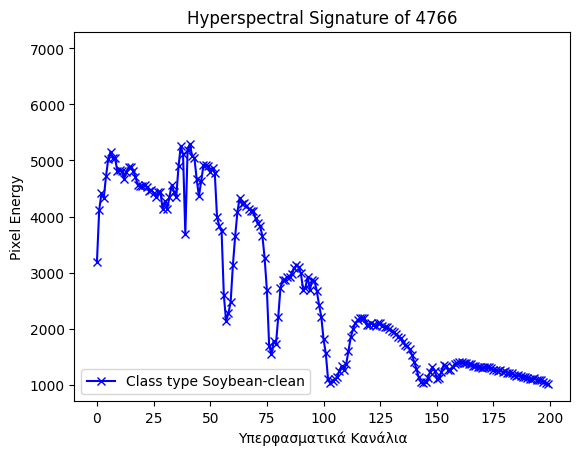

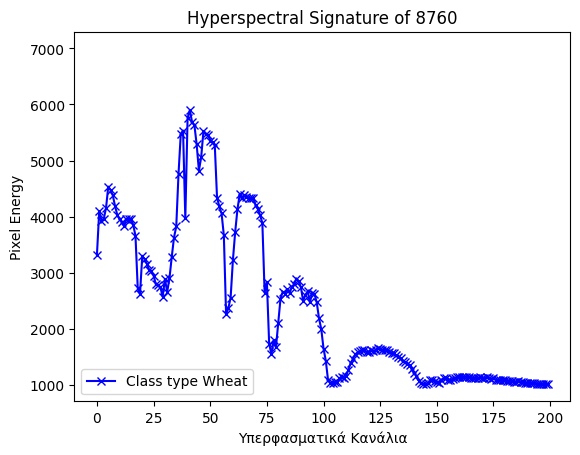

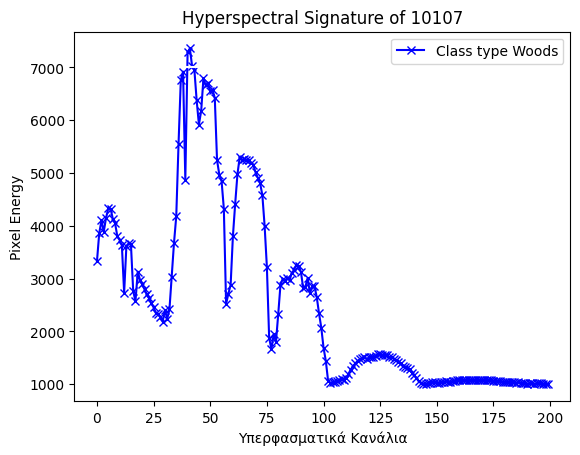

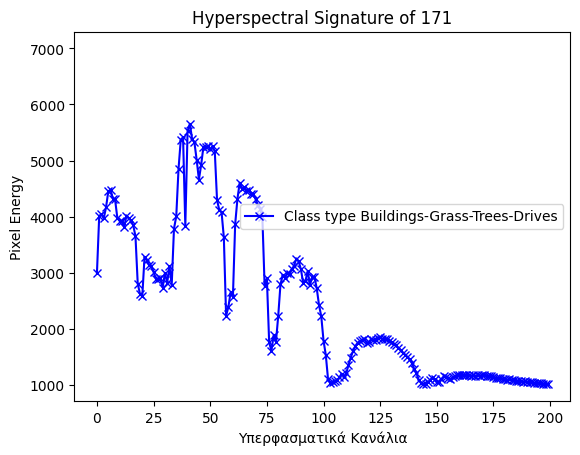

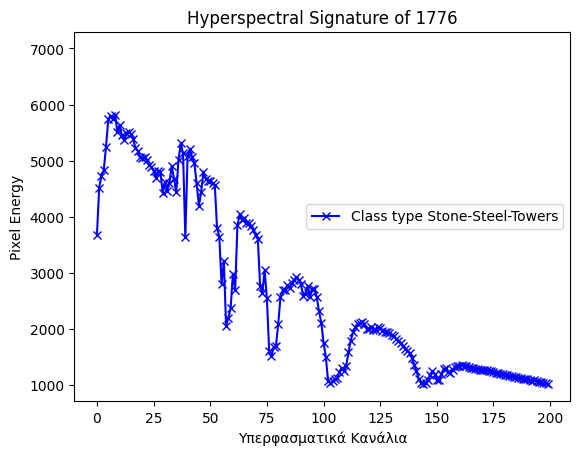

In [109]:
x = np.array(range(0, 200))
const = [7000]*200

for i in range(1, 17):
  pixel_sig = data_clean[random_pixel[i], :]
  plt.title(f"Hyperspectral Signature of {random_pixel[i]}")
  plt.xlabel("Υπερφασματικά Κανάλια")
  plt.ylabel("Pixel Energy")
  plt.plot(x, pixel_sig, color = "blue", marker = "x", label = f"Class type {classes[i]}")
  plt.plot(x, const, color = "white")
  plt.legend()
  plt.show()

3.δ. Επαναλάβετε την προηγούμενη διαδικασία άλλες δύο φορές, σχεδιάζοντας τα νέα διαγράμματα.

Iter 1.

In [110]:
random_pixel=rand_pixel(labels_clean)

1 : Pixel 5936 represents class type Alfalfa
2 : Pixel 6844 represents class type Corn-notill
3 : Pixel 5456 represents class type Corn-mintill
4 : Pixel 2893 represents class type Corn
5 : Pixel 7012 represents class type Grass-pasture
6 : Pixel 8663 represents class type Grass-trees
7 : Pixel 6417 represents class type Grass-pasture-mowed
8 : Pixel 4543 represents class type Hay-windrowed
9 : Pixel 5285 represents class type Oats
10 : Pixel 5512 represents class type Soybean-notill
11 : Pixel 6956 represents class type Soybean-mintill
12 : Pixel 4455 represents class type Soybean-clean
13 : Pixel 9133 represents class type Wheat
14 : Pixel 8892 represents class type Woods
15 : Pixel 621 represents class type Buildings-Grass-Trees-Drives
16 : Pixel 1777 represents class type Stone-Steel-Towers


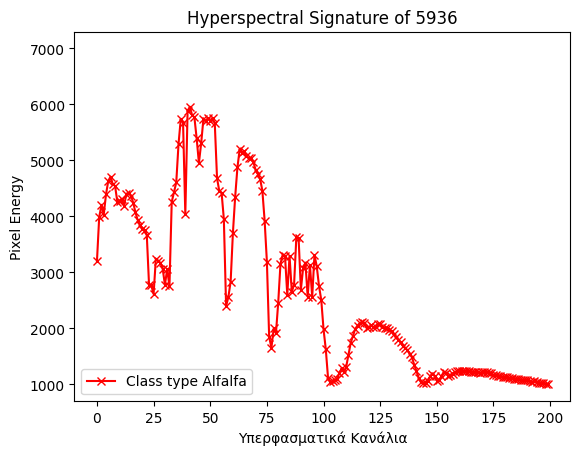

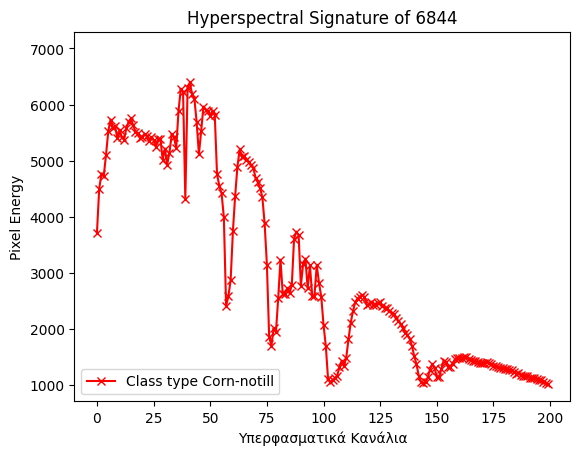

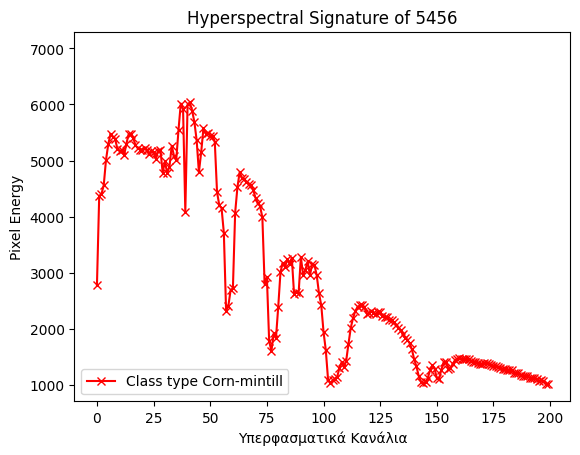

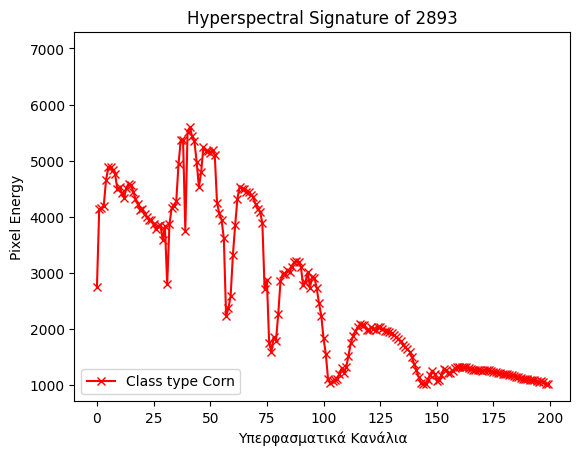

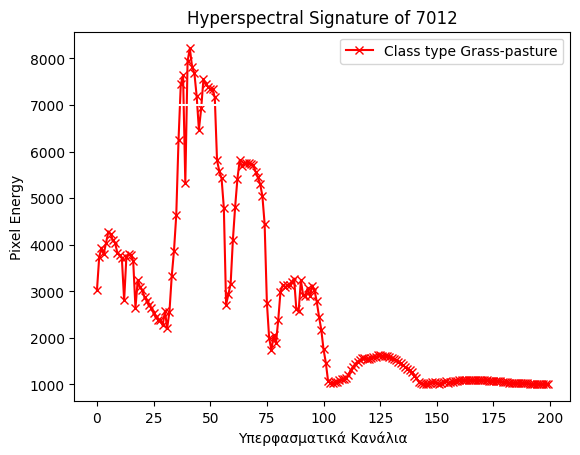

...

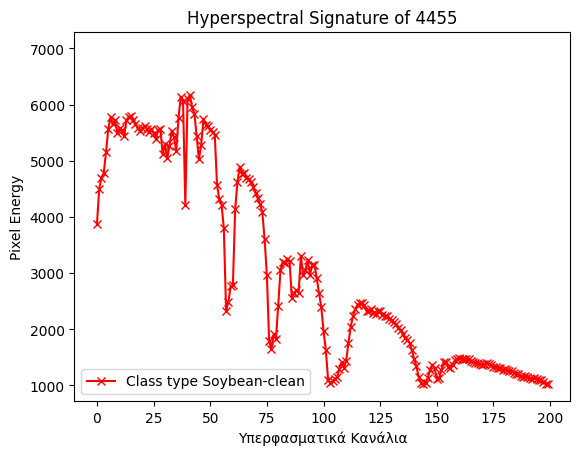

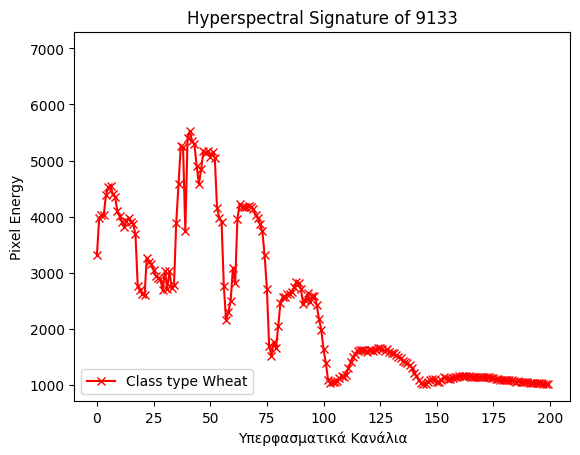

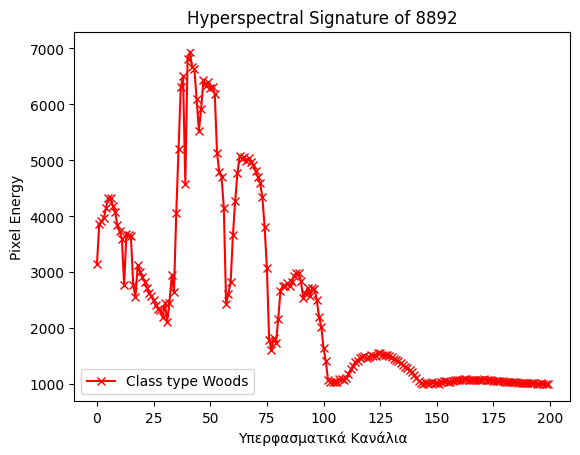

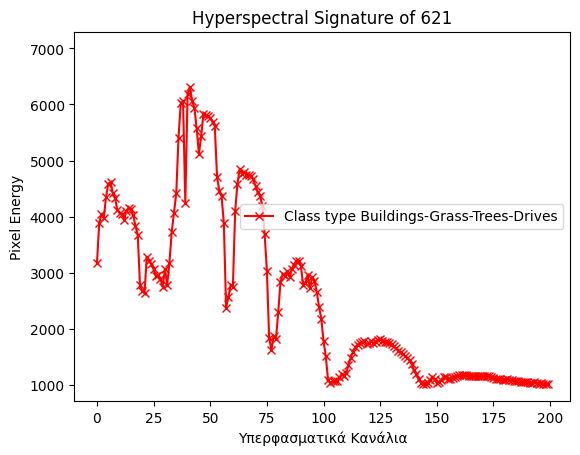

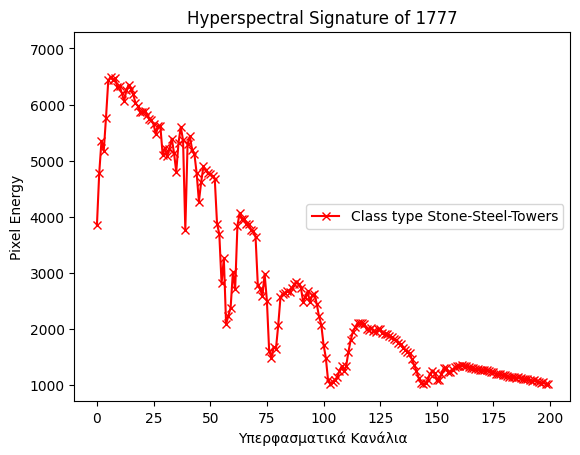

In [111]:
x = np.array(range(0, 200))
const = [7000]*200

for i in range(1, 17):
  pixel_sig = data_clean[random_pixel[i], :]
  plt.title(f"Hyperspectral Signature of {random_pixel[i]}")
  plt.xlabel("Υπερφασματικά Κανάλια")
  plt.ylabel("Pixel Energy")
  plt.plot(x, pixel_sig, color = "red", marker = "x", label = f"Class type {classes[i]}")
  plt.plot(x, const, color = "white")
  plt.legend()
  plt.show()

Iter 2.

In [112]:
random_pixel=rand_pixel(labels_clean)

1 : Pixel 6060 represents class type Alfalfa
2 : Pixel 2818 represents class type Corn-notill
3 : Pixel 355 represents class type Corn-mintill
4 : Pixel 2898 represents class type Corn
5 : Pixel 6505 represents class type Grass-pasture
6 : Pixel 7833 represents class type Grass-trees
7 : Pixel 6170 represents class type Grass-pasture-mowed
8 : Pixel 4042 represents class type Hay-windrowed
9 : Pixel 5876 represents class type Oats
10 : Pixel 4943 represents class type Soybean-notill
11 : Pixel 3818 represents class type Soybean-mintill
12 : Pixel 1434 represents class type Soybean-clean
13 : Pixel 9063 represents class type Wheat
14 : Pixel 1291 represents class type Woods
15 : Pixel 26 represents class type Buildings-Grass-Trees-Drives
16 : Pixel 1244 represents class type Stone-Steel-Towers


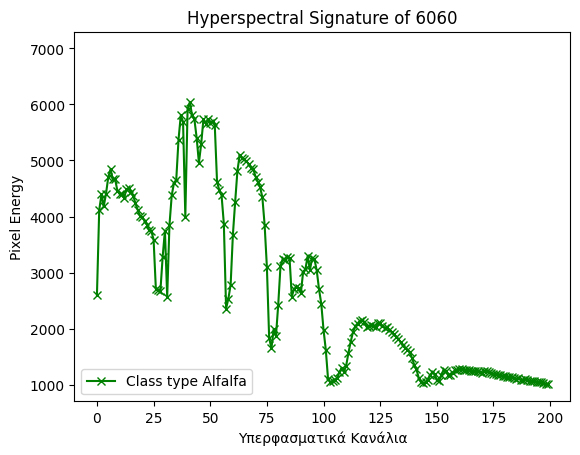

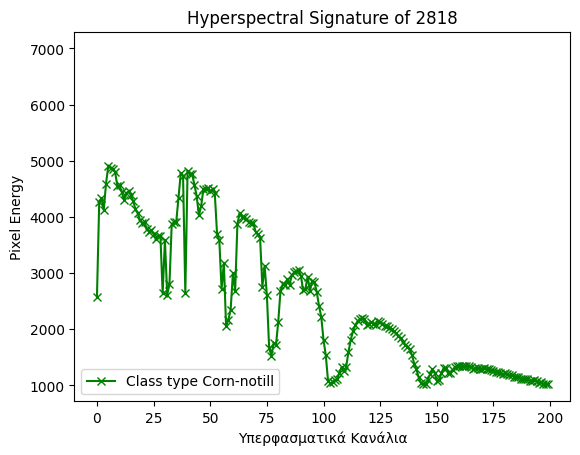

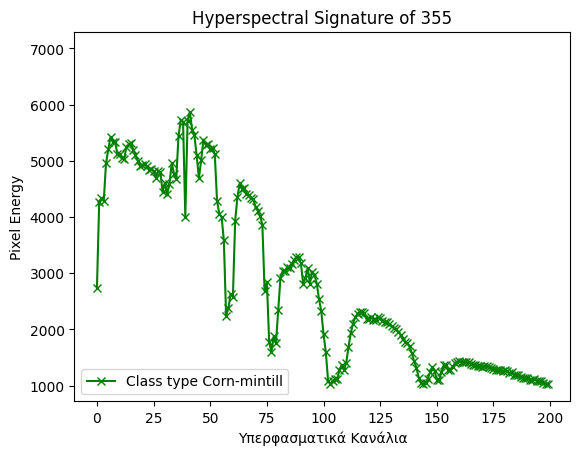

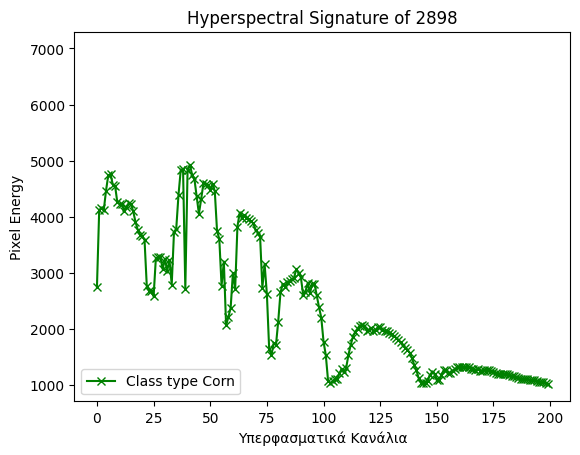

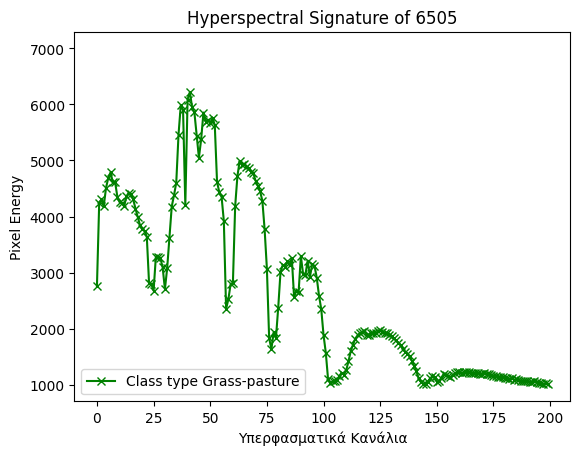

...

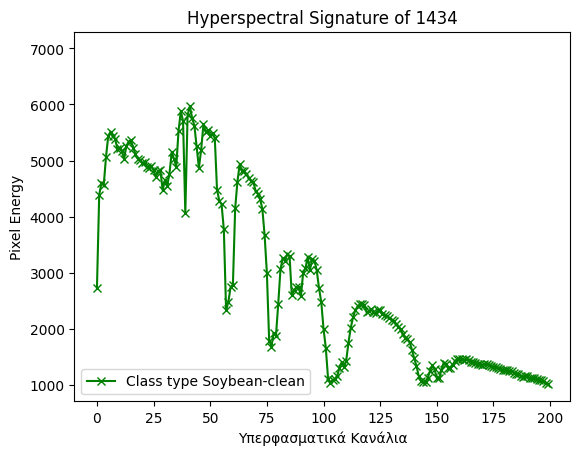

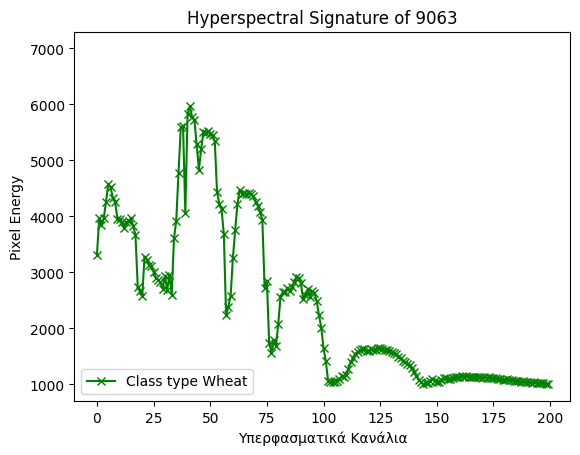

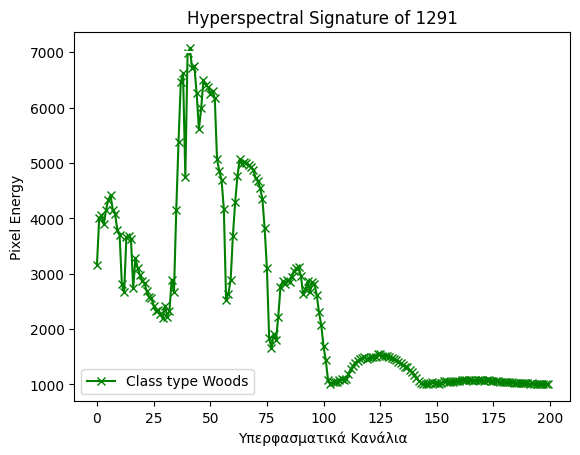

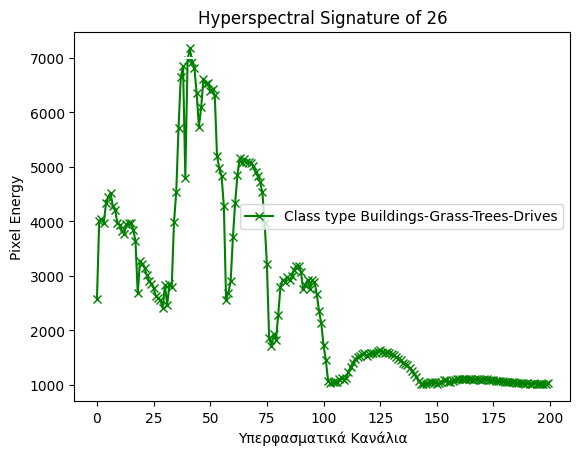

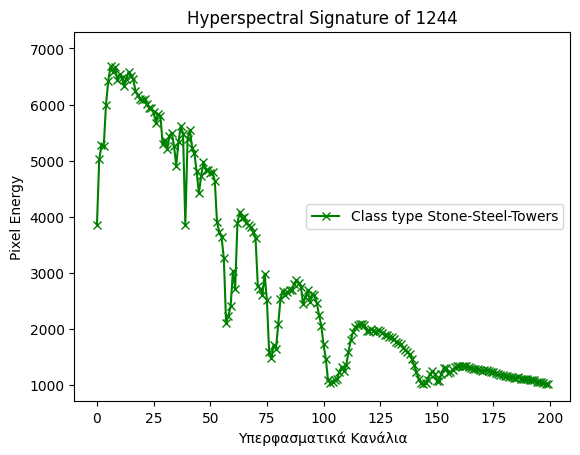

In [113]:
x = np.array(range(0, 200))
const = [7000]*200

for i in range(1, 17):
  pixel_sig = data_clean[random_pixel[i], :]
  plt.title(f"Hyperspectral Signature of {random_pixel[i]}")
  plt.xlabel("Υπερφασματικά Κανάλια")
  plt.ylabel("Pixel Energy")
  plt.plot(x, pixel_sig, color = "green", marker = "x", label = f"Class type {classes[i]}")
  plt.plot(x, const, color = "white")
  plt.legend()
  plt.show()

3.ε. Σημειώστε τις παρατηρήσεις σας και τα συμπεράσματα σας. Προσπαθήστε να απαντήσετε στις ακόλουθες ερωτήσεις:
    
* Με βάση τα προηγούμενα διαγράμματα θεωρείτε ότι κάποιες καλλιέργειες είναι πιο εύκολα διαχωρίσιμες από άλλες με βάση τη φασματική υπογραφή τους;
* Θεωρείτε ότι όλα τα κανάλια παρέχουν χρήσιμη πληροφορία για το διαχωρισμό;

Παρατηρώντας τις φασματικές υπογραφές που παρουσιάζονται στα διαγράμματα καταλαβαίνουμε ότι η πλειοψηφία παρουσιάζει αρκετές ομοιότητες ως προς την κατανομή του διαγράμματος.Παρόλα αυτά παρατηρούμε τις μεγαλύτερες διαφορές στο εύρος υπερφασματικών καναλιών 20-100 πράγμα που καθιστά εύκολο τον διαχωρισμό τους.Από την άλλη για το διάστημα 100-200 έχουν αρκετά κοινή κατανομή γεγονός που δεν παρέχει χρήσιμη πληροφορία για τον διαχωρισμό τους.


3.στ. Σχεδιάστε ένα heatmap, που να δείχνει τη συσχέτιση μεταξύ των διαφορετικών καναλιών

In [114]:
import pandas as pd

df = pd.DataFrame(data_clean)

In [115]:
import seaborn as sn
import matplotlib.pyplot as plt

corr_matrix = df.corr()
fig, ax = plt.subplots(figsize=(100,100))         # Sample figsize in inches
sn.heatmap(corr_matrix, annot=True,linewidths=.5, ax=ax)

<Axes: >

### 4. Συσταδοποίηση με χρήση του αλγορίθμου k-Means

 4.α. Εφαρμόστε τον αλγόριθμο k-Means (sklearn.cluster) στα δεδομένα (εφόσον κάνατε την προεπεξεργασία του Βήματος 3). Χρησιμοποιήστε την τιμή `n_cluster=16`.

In [116]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=16, random_state=17)
y_pred = kmeans.fit_predict(data_clean)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


4.β. Υπολογίστε τις ακόλουθες μετρικές των προβλέψεων του αλγορίθμου

* Accuracy Score
* Rand Score
* Silhouette Score

Σημειώστε ότι για τη συνάρτηση rand_score μπορείτε να δώσετε σαν είσοδο τα αρχικά labels που σας δόθηκαν μαζί με τα predicted. Για τον υπολογισμό όμως του accuracy, θα πρέπει να αντιστοιχίσουμε τα διαφορετικά ID των clusters στην έξοδο του KMeans, με τις κατηγορίες της αρχικής επισημείωσης. Για την μετατροπή αυτή μπορείτε να χρησιμοποιήσετε την ακόλουθη συνάρτηση που σας δίνεται `translate_predicted_labels`.

In [117]:
!pip install munkres
from munkres import Munkres

def make_cost_matrix(c1, c2):
    """
    """
    uc1 = np.unique(c1)
    uc2 = np.unique(c2)
    l1 = uc1.size
    l2 = uc2.size
    assert(l1 == l2 and np.all(uc1 == uc2))

    m = np.ones([l1, l2])
    for i in range(l1):
        it_i = np.nonzero(c1 == uc1[i])[0]
        for j in range(l2):
            it_j = np.nonzero(c2 == uc2[j])[0]
            m_ij = np.intersect1d(it_j, it_i)
            m[i,j] =  -m_ij.size
    return m

def translate_clustering(clt, mapper):
    return np.array([ mapper[i] for i in clt ])

def accuracy(cm):
    """computes accuracy from confusion matrix"""
    return np.trace(cm, dtype=float) / np.sum(cm)


def translate_predicted_labels(predicted_y, y):
    cost_matrix = make_cost_matrix(predicted_y, y)
    m = Munkres()
    indexes = m.compute(cost_matrix)
    mapper = { old: new for (old, new) in indexes }

    for old, new in mapper.items():
        print("map: %s --> %s" %(old, new))

    translated_predicted_y = translate_clustering(predicted_y, mapper)
    return translated_predicted_y

# usage:
# translate_predicted_labels(predicted, gt)
# predicted: N, array of predicted labels (predicted cluster IDs)
# gt: N, array of ground truth classes

**Accuracy Score**

In [118]:
labels_clean = labels_clean - 1

In [119]:
#alignment for trans_pred<----y_pred y_pred [0-15] / labels_clean[1-16] remove undefined


from sklearn.metrics.cluster import adjusted_rand_score
trans_pred = translate_predicted_labels(y_pred,labels_clean )

print(adjusted_rand_score(labels_clean , trans_pred))

map: 0 --> 3
map: 1 --> 14
map: 2 --> 10
map: 3 --> 13
map: 4 --> 2
map: 5 --> 8
map: 6 --> 11
map: 7 --> 5
map: 8 --> 12
map: 9 --> 0
map: 10 --> 4
map: 11 --> 1
map: 12 --> 9
map: 13 --> 7
map: 14 --> 6
map: 15 --> 15
0.2053910817821694


**Rand Score**

In [120]:
from sklearn.metrics.cluster import adjusted_rand_score

print(adjusted_rand_score(labels_clean, y_pred))

0.2053910817821694


**Silhouette Score**

In [121]:
from sklearn.metrics import silhouette_score

print(silhouette_score(data_clean, kmeans.labels_))

0.2814875425943011


4.δ. Σχεδιάστε το confusion matrix (χρησιμοποιήστε τα αντιστοιχισμένα predicted labels).

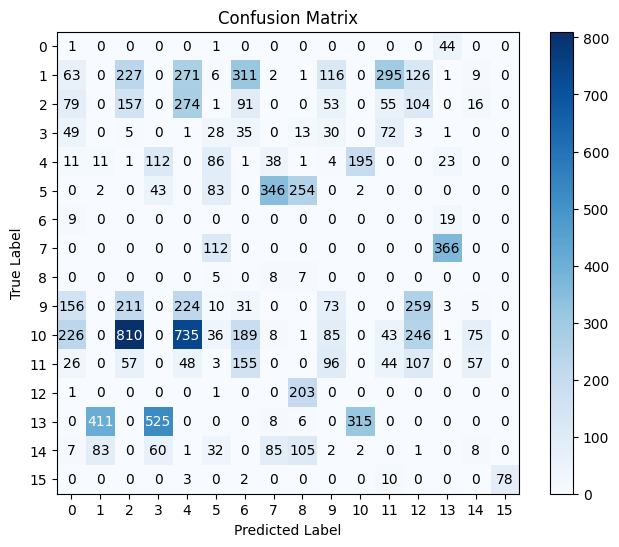

In [122]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Assuming 'labels_clean' and 'y_pred' are your true labels and predicted labels
# Compute confusion matrix
cnf_matrix = confusion_matrix(labels_clean, y_pred)

# Plot confusion matrix as an image
plt.figure(figsize=(8, 6))
plt.imshow(cnf_matrix, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

# Set labels
classes = np.unique(labels_clean)
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes)
plt.yticks(tick_marks, classes)

# Display values in each cell
for i in range(len(classes)):
    for j in range(len(classes)):
        plt.text(j, i, str(cnf_matrix[i, j]), ha='center', va='center', color='white' if cnf_matrix[i, j] > cnf_matrix.max() / 2 else 'black')

plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

4.ε. Όπως στο 2.δ. σχεδιάστε με χρήση της matplotlib τα predicted labels σε μορφή εικόνας.

### 5. Μείωση διαστατικότητας δεδομένων

5.α. Εφαρμόστε στα δεδομένα τη μέθοδο μείωσης διαστατικότητας PCA. Επιλέξτε `n_components=3`

In [123]:
from sklearn.decomposition import PCA

pca = PCA(n_components=3)
X3D = pca.fit_transform(data_clean)

5.β. Τι ποσοστό της διακύμανσης των δεδομένων διατηρείτε με `n_components=3` ?
Hint: sklearn.decomposition.PCA.explained_variance_ratio_

In [124]:
pca.explained_variance_ratio_

array([0.66452713, 0.2654258 , 0.01206197])

In [125]:
1 - pca.explained_variance_ratio_.sum()

0.05798510402283363

### 6. Συνδυασμός μείωσης διαστατικότητας και k-Means

6.α. Εφαρμόστε τον αλγόριθμο kmeans στα δεδομένα μειωμένης διαστατικότητας `n_components=3`, και υπολογίστε εκ νέου τις μετρικές του Βήματος 4.γ.

In [126]:
from sklearn.cluster import KMeans

kmeans2 = KMeans(n_clusters=16, random_state=42)
y_pred2 = kmeans2.fit_predict(X3D)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [127]:
y_trans = translate_predicted_labels(y_pred2, labels_clean)
from sklearn.metrics import accuracy_score
print(accuracy_score(labels_clean,y_trans))

map: 0 --> 2
map: 1 --> 13
map: 2 --> 12
map: 3 --> 10
map: 4 --> 4
map: 5 --> 8
map: 6 --> 3
map: 7 --> 0
map: 8 --> 9
map: 9 --> 15
map: 10 --> 11
map: 11 --> 14
map: 12 --> 6
map: 13 --> 1
map: 14 --> 7
map: 15 --> 5
0.3450092691969948


In [128]:
from sklearn.metrics.cluster import adjusted_rand_score

print(adjusted_rand_score(labels_clean, y_pred2))

0.20159043693986198


In [129]:
from sklearn.metrics import silhouette_score

print(silhouette_score(X3D, kmeans2.labels_))

0.3746252171912358


6.β. Δοκιμάστε διαφορετικές τιμές για το `n_components` (από 1 έως 10) και για κάθε μία από αυτές τις τιμές τρέξτε εκ νέου τον k-Μeans, υπολογίζοντας τα τελικά scores. Για κάθε μετρική, φτιάξτε ένα διάγραμμα που στον άξονα των Χ θα έχει τον αριθμό `n_components` και στον άξονα των Υ, την τιμή της μετρικής. Τι συμπεράσματα βγάζετε;

In [130]:
rand_scores = [0] * 11
sil_scores = [0] * 11
acc_scores = [0] * 11

for i in range(1, 11):
  pcaiter = PCA(n_components=i)
  XiterD = pcaiter.fit_transform(data_clean)
  kmeansiter = KMeans(n_clusters=16, random_state=42)
  y_prediter = kmeansiter.fit_predict(XiterD)
  rand_scores[i] = adjusted_rand_score(labels_clean, y_prediter)
  sil_scores[i] = silhouette_score(XiterD, kmeansiter.labels_)
  y_iter_trans = translate_predicted_labels(y_prediter, labels_clean)
  acc_scores[i] = accuracy_score(labels_clean, y_prediter)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


map: 0 --> 10
map: 1 --> 12
map: 2 --> 8
map: 3 --> 6
map: 4 --> 1
map: 5 --> 11
map: 6 --> 7
map: 7 --> 14
map: 8 --> 15
map: 9 --> 5
map: 10 --> 9
map: 11 --> 4
map: 12 --> 13
map: 13 --> 3
map: 14 --> 0
map: 15 --> 2


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


map: 0 --> 1
map: 1 --> 7
map: 2 --> 13
map: 3 --> 10
map: 4 --> 11
map: 5 --> 5
map: 6 --> 6
map: 7 --> 2
map: 8 --> 4
map: 9 --> 3
map: 10 --> 12
map: 11 --> 15
map: 12 --> 8
map: 13 --> 9
map: 14 --> 14
map: 15 --> 0


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


map: 0 --> 2
map: 1 --> 13
map: 2 --> 12
map: 3 --> 10
map: 4 --> 4
map: 5 --> 8
map: 6 --> 3
map: 7 --> 0
map: 8 --> 9
map: 9 --> 15
map: 10 --> 11
map: 11 --> 14
map: 12 --> 6
map: 13 --> 1
map: 14 --> 7
map: 15 --> 5


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


map: 0 --> 11
map: 1 --> 5
map: 2 --> 9
map: 3 --> 4
map: 4 --> 7
map: 5 --> 0
map: 6 --> 3
map: 7 --> 14
map: 8 --> 1
map: 9 --> 6
map: 10 --> 10
map: 11 --> 8
map: 12 --> 12
map: 13 --> 15
map: 14 --> 13
map: 15 --> 2


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


map: 0 --> 11
map: 1 --> 13
map: 2 --> 12
map: 3 --> 5
map: 4 --> 3
map: 5 --> 1
map: 6 --> 4
map: 7 --> 6
map: 8 --> 9
map: 9 --> 0
map: 10 --> 7
map: 11 --> 8
map: 12 --> 10
map: 13 --> 14
map: 14 --> 15
map: 15 --> 2


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


map: 0 --> 5
map: 1 --> 10
map: 2 --> 4
map: 3 --> 13
map: 4 --> 9
map: 5 --> 2
map: 6 --> 11
map: 7 --> 7
map: 8 --> 14
map: 9 --> 12
map: 10 --> 6
map: 11 --> 0
map: 12 --> 1
map: 13 --> 15
map: 14 --> 3
map: 15 --> 8


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


map: 0 --> 0
map: 1 --> 9
map: 2 --> 14
map: 3 --> 11
map: 4 --> 5
map: 5 --> 2
map: 6 --> 4
map: 7 --> 10
map: 8 --> 7
map: 9 --> 12
map: 10 --> 6
map: 11 --> 3
map: 12 --> 1
map: 13 --> 15
map: 14 --> 13
map: 15 --> 8


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


map: 0 --> 10
map: 1 --> 5
map: 2 --> 4
map: 3 --> 0
map: 4 --> 9
map: 5 --> 1
map: 6 --> 6
map: 7 --> 2
map: 8 --> 14
map: 9 --> 11
map: 10 --> 12
map: 11 --> 8
map: 12 --> 3
map: 13 --> 7
map: 14 --> 15
map: 15 --> 13


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


map: 0 --> 13
map: 1 --> 3
map: 2 --> 6
map: 3 --> 1
map: 4 --> 11
map: 5 --> 9
map: 6 --> 12
map: 7 --> 5
map: 8 --> 10
map: 9 --> 8
map: 10 --> 7
map: 11 --> 2
map: 12 --> 14
map: 13 --> 4
map: 14 --> 0
map: 15 --> 15


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


map: 0 --> 11
map: 1 --> 5
map: 2 --> 3
map: 3 --> 0
map: 4 --> 1
map: 5 --> 12
map: 6 --> 6
map: 7 --> 9
map: 8 --> 4
map: 9 --> 7
map: 10 --> 15
map: 11 --> 8
map: 12 --> 2
map: 13 --> 10
map: 14 --> 14
map: 15 --> 13


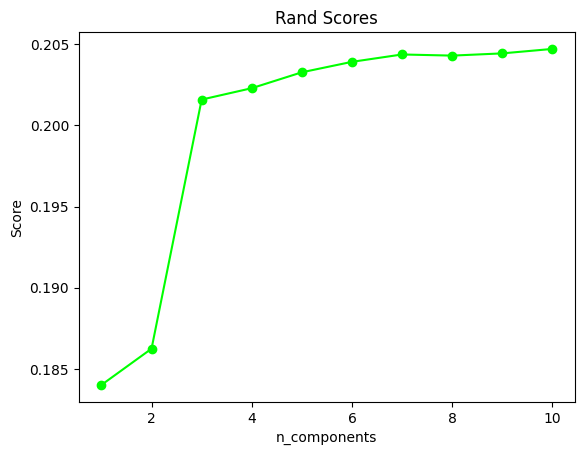

In [131]:
xax = np.array(range(1, 11))
rand_scores_cor = rand_scores[1:]

plt.title("Rand Scores")
plt.xlabel("n_components")
plt.ylabel("Score")
plt.plot(xax, rand_scores_cor, color = "lime", marker = "o")
plt.show()

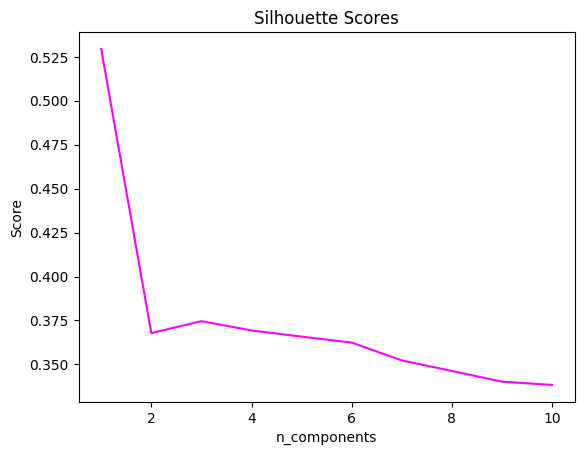

In [132]:
xax = np.array(range(1, 11))
sil_scores_cor = sil_scores[1:]

plt.title("Silhouette Scores")
plt.xlabel("n_components")
plt.ylabel("Score")
plt.plot(xax, sil_scores_cor, color = "fuchsia")
plt.show()

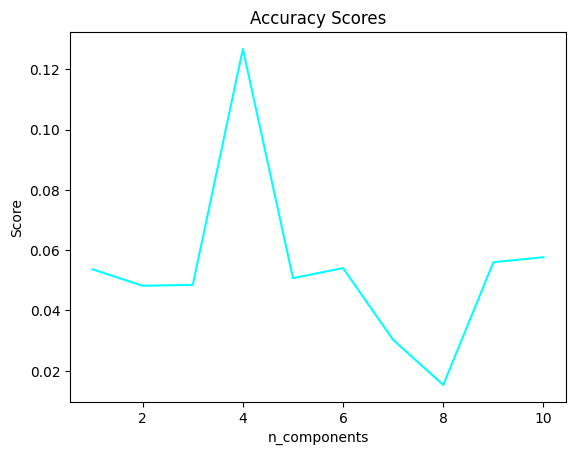

In [133]:
xax = np.array(range(1, 11))
acc_scores_cor = acc_scores[1:]

plt.title("Accuracy Scores")
plt.xlabel("n_components")
plt.ylabel("Score")
plt.plot(xax, acc_scores_cor, color = "cyan")
plt.show()